<a href="https://colab.research.google.com/github/dylan-greenberg/Python-Projects-Labs/blob/main/Lab5_MegaTelCo_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IS 4487 Module 5

## Outline

 - Identify the target variable for an analysis based on the business problem.
 - Compute the mean of a binary variable.
 - Plot a numeric (or count) variable against a categorical
    variable.
 - Calculate a count (and a proportion) for a categorical variable
    and visualize the result into a plot.

<a href="https://colab.research.google.com/github/Stan-Pugsley/is_4487_base/blob/main/Labs/Scripts/lab5_megatelco_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Megatelco Data Dictionary

 DEMOGRAPHIC VARIABLES:
 - College - has the customer attended some college (one, zero)
 - Income - annual income of customer
 - House - estimated price of the customer's home (if applicable)

 USAGE VARIABLES:
 - Data Overage Mb - Average number of megabytes that the customer used in excess of the plan limit (over last 12 months)
 - Data Leftover Mb - Average number of megabytes that the customer use was below the plan limit (over last 12 months)
 - Data Mb Used - Average number of megabytes used per month (over last 12 months)
 - Text Message Count - Average number of texts per month (over last 12 months)
 - Over 15 Minute Calls Per Month - Average number of calls over 15 minutes in duration per month (over last 12 months)
 - Average Call Duration- Average call duration (over last 12 months)

PHONE VARIABLES:
 - Operating System - Current operating system of phone
 - Handset Price - Retail price of the phone used by the customer

ATTITUDINAL VARIABLES:
 - Reported Satisfaction - Survey response to "How satisfied are you with your current phone plan?" (high, med, low)
 - Reported Usage Level - Survey response to "How much do your use your phone?" (high, med, low)
 - Considering Change of Plan - Survey response to "Are you currently planning to change companies when your contract expires?" (high, med, low)

OTHER VARIABLES
 - Leave - Did this customer churn with the last contract expiration? (LEAVE, STAY)
 - ID - Customer identifier

##Load Libraries

In this class we will be using
- Pandas
- Scikitlearn
- Matplotlib


In [ ]:
import pandas as pd
import matplotlib as mpl
import sklearn as sl

## Import Data into Dataframe

➡️ Assignment Tasks
- Import data from the Megatelco dataset into a dataframe (in GitHub go to Labs > DataSets)
- Describe or profile the dataframe


In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/Stan-Pugsley/is_4487_base/refs/heads/main/Labs/DataSets/megatelco_leave_survey.csv')
print(df.head(20))

   college  income  data_overage_mb  data_leftover_mb  data_mb_used  \
0      one  403137               70                 0          6605   
1     zero  129700               67                16          6028   
2     zero   69741               60                 0          1482   
3      one  377572                0                22          3005   
4     zero  382080                0                 0          1794   
5     zero  309746                0                56          2675   
6      one  325592               79                24          7300   
7      one  131230                0                 0          4489   
8      one  193667                0                 0          1023   
9      one  419573                0                74          4631   
10    zero  262085              222                17           530   
11     one  310841               74                14          7025   
12    zero  398292                0                 0          3681   
13    

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   college                      14999 non-null  object 
 1   income                       14999 non-null  int64  
 2   data_overage_mb              14999 non-null  int64  
 3   data_leftover_mb             14999 non-null  int64  
 4   data_mb_used                 14999 non-null  int64  
 5   text_message_count           14999 non-null  int64  
 6   house                        14999 non-null  int64  
 7   handset_price                14999 non-null  int64  
 8   over_15mins_calls_per_month  14996 non-null  float64
 9   average_call_duration        14999 non-null  int64  
 10  reported_satisfaction        14999 non-null  object 
 11  reported_usage_level         14999 non-null  object 
 12  considering_change_of_plan   14999 non-null  object 
 13  leave           

In [ ]:
df.describe()
# we see that there are outliers in the data that need to be filtered out; negative min for income, negative min for house, and handset price of 14,999 is an outlier

,income,data_overage_mb,data_leftover_mb,data_mb_used,text_message_count,house,handset_price,over_15mins_calls_per_month,average_call_duration,id
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,1.499900e+04,14999.000000,14996.000000,14999.000000,14999.000000
mean,241989.140476,153.522502,37.522035,4202.624442,135.622041,8.771616e+05,795.146810,10.568685,9.731515,11859.749517
std,109603.370138,113.018111,28.046409,2202.763649,48.831061,2.870316e+05,1235.785429,8.402100,5.195150,6812.842446
min,-65000.000000,0.000000,0.000000,400.000000,52.000000,-4.630000e+02,215.000000,0.000000,1.000000,2.000000
25%,147822.000000,54.000000,12.000000,2294.000000,93.000000,6.444405e+05,498.000000,3.000000,5.000000,6137.000000
50%,241656.000000,151.000000,35.000000,4223.000000,135.000000,8.764130e+05,778.000000,9.000000,10.000000,11760.000000
75%,336456.500000,242.000000,62.000000,6080.000000,178.000000,1.098834e+06,1064.000000,17.000000,14.000000,17396.000000
max,432000.000000,380.000000,89.000000,8000.000000,220.000000,1.456389e+06,125000.000000,35.000000,19.000000,25354.000000


In [ ]:
handset_price_count = df[df['handset_price'] > 2000].shape[0]
print(handset_price_count)

3


In [ ]:
filtered_data = df[(df['handset_price'] > 2000)]
print(filtered_data)

    college  income  data_overage_mb  data_leftover_mb  data_mb_used  \
600    zero  400819               47                83          1016   
646    zero  255920                0                61          7790   
695     one  279209                0                10          3317   

     text_message_count    house  handset_price  over_15mins_calls_per_month  \
600                 140  1143853          20000                          3.0   
646                  98  1192419          75000                         21.0   
695                  96  1070968         125000                          1.0   

     average_call_duration reported_satisfaction reported_usage_level  \
600                      1                   low                 high   
646                      1                  high                  low   
695                      1                  high                  low   

    considering_change_of_plan  leave     id operating_system  
600                        yes  L

In [ ]:
income_count = df[df['income']<0].shape[0]
print(income_count)

2


In [ ]:
data_income_filtered = df[(df['income']<0)]
print(data_income_filtered)

    college  income  data_overage_mb  data_leftover_mb  data_mb_used  \
58     zero  -65000                0                 0          6444   
136     one  -32000                0                 0           466   

     text_message_count    house  handset_price  over_15mins_calls_per_month  \
58                  160   542857            993                          0.0   
136                 154  1426087            651                          1.0   

     average_call_duration reported_satisfaction reported_usage_level  \
58                      11                   low                 high   
136                     11                   low                  low   

    considering_change_of_plan leave    id operating_system  
58                          no  STAY   467              IOS  
136                         no  STAY  3173          Android  


## Clean up the dataset  

In [ ]:
df_clean = df[(df['house'] > 0) & (df['income'] > 0) & (df['handset_price'] < 1000)]
df_clean.describe()

,income,data_overage_mb,data_leftover_mb,data_mb_used,text_message_count,house,handset_price,over_15mins_calls_per_month,average_call_duration,id
count,10414.000000,10414.000000,10414.000000,10414.000000,10414.000000,1.041400e+04,10414.000000,10412.000000,10414.000000,10414.000000
mean,242040.366526,153.842712,37.473593,4195.329364,135.500384,8.757861e+05,607.428462,10.571072,9.746207,11839.815729
std,109051.427100,113.017992,28.015913,2205.005466,48.915506,2.868503e+05,225.509939,8.444673,5.180746,6804.752823
min,52491.000000,0.000000,0.000000,400.000000,52.000000,3.202380e+05,215.000000,0.000000,1.000000,2.000000
25%,148479.750000,55.000000,12.000000,2291.000000,93.000000,6.447420e+05,413.000000,3.000000,5.000000,6071.750000
50%,241653.000000,151.000000,35.000000,4206.500000,135.000000,8.730110e+05,608.000000,9.000000,10.000000,11743.000000
75%,335655.500000,242.000000,62.000000,6079.000000,178.000000,1.098260e+06,801.750000,17.000000,14.000000,17330.000000
max,431916.000000,380.000000,89.000000,8000.000000,220.000000,1.456389e+06,999.000000,35.000000,19.000000,25354.000000


## Calculate distribution of the outcome  

What is the proportion of people who churned?

In [ ]:
df_clean[['house','leave']].groupby('leave').mean().round(2)

,house
leave,
LEAVE,755351.30
STAY,995805.27


# Create basic charts

- Bar chart
- Histogram
- Box plot
- Scatter plot

<Axes: xlabel='leave'>

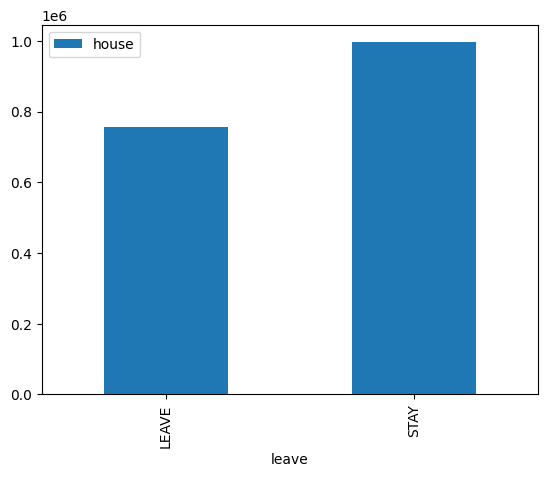

In [ ]:
#Bar chart
df_clean[['house','leave']].groupby('leave').mean('house').plot.bar()


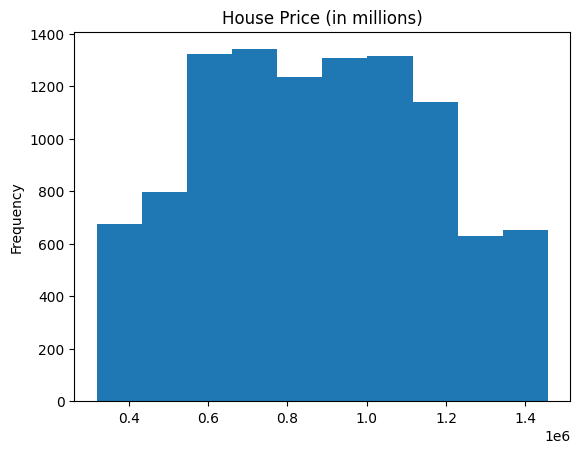

In [ ]:
#Histogram
Hist = df_clean['house'].plot.hist(bins=10,title='House Price (in millions)')


<Axes: title={'center': 'house'}, xlabel='[leave]'>

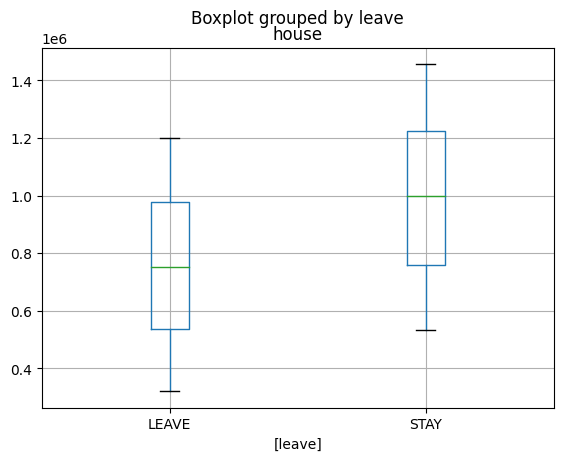

In [ ]:
#Boxplot
df_clean[['leave','house']].boxplot(by='leave')

# Explore Relationships

###How does College affect leaving?

<Axes: xlabel='leave'>

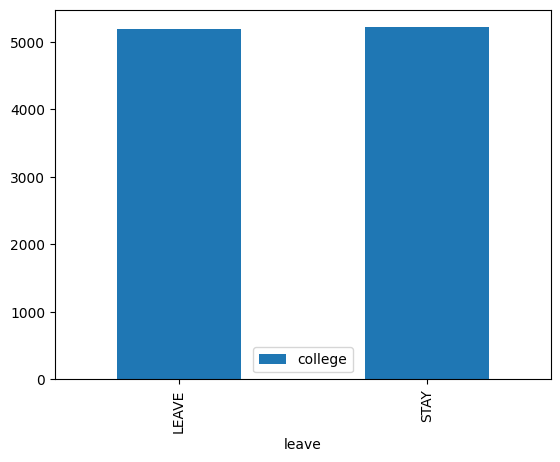

In [ ]:
#Bar chart with counts
df_clean[['college','leave']].groupby('leave').count().plot.bar()

<Axes: xlabel='leave'>

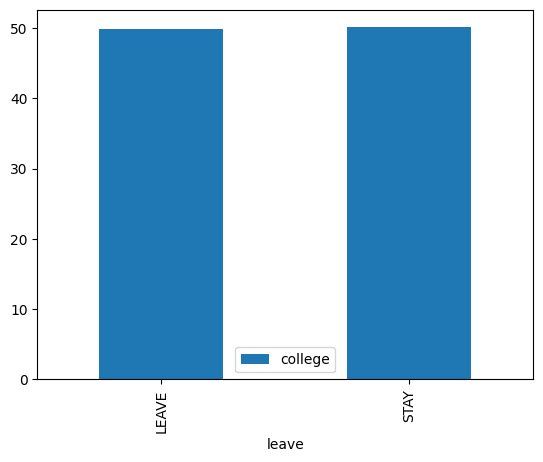

In [ ]:
#Bar chart with percentage
college_summary = df_clean[['college','leave']].groupby('leave').count()

college_summary['college'] = (college_summary['college'] / college_summary['college'].sum()) * 100
#college_summary.head()
college_summary.plot.bar()

### How does phone price affect leaving?

<Axes: xlabel='leave'>

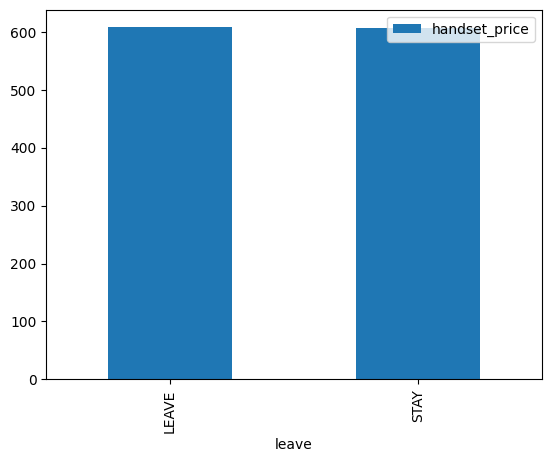

In [ ]:
#Bar chart with mean price
handset_price_summary = df_clean[['handset_price','leave']].groupby('leave').mean(['handset_price'])
#handset_price_summary.head()

handset_price_summary.plot.bar()

### How about considering leaving?

<Axes: xlabel='leave'>

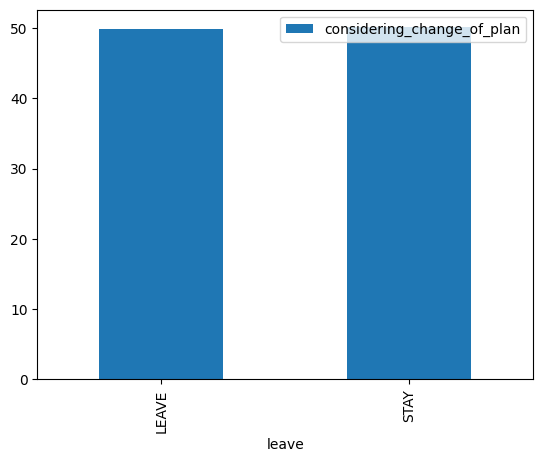

In [ ]:
#Bar chart with percentage
plan = df_clean[['considering_change_of_plan','leave']].groupby('leave').count()

plan['considering_change_of_plan'] = (plan['considering_change_of_plan'] / plan['considering_change_of_plan'].sum()) * 100

plan.plot.bar()

## Create a Pair Plot
➡️ Assignment Tasks
- Import seaborn
- Create a Seaborn "pairplot" using all variables, with the color determine by "leave"
- Display the plot

In [ ]:
#pair plot

In [ ]:
## Additional Cleanup

➡️ Assignment Tasks
- Remove any records with null values from the dataframe

In [ ]:
df_clean_noNull = df_clean.dropna()
df_clean_noNull.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10412 entries, 0 to 14998
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   college                      10412 non-null  object 
 1   income                       10412 non-null  int64  
 2   data_overage_mb              10412 non-null  int64  
 3   data_leftover_mb             10412 non-null  int64  
 4   data_mb_used                 10412 non-null  int64  
 5   text_message_count           10412 non-null  int64  
 6   house                        10412 non-null  int64  
 7   handset_price                10412 non-null  int64  
 8   over_15mins_calls_per_month  10412 non-null  float64
 9   average_call_duration        10412 non-null  int64  
 10  reported_satisfaction        10412 non-null  object 
 11  reported_usage_level         10412 non-null  object 
 12  considering_change_of_plan   10412 non-null  object 
 13  leave                

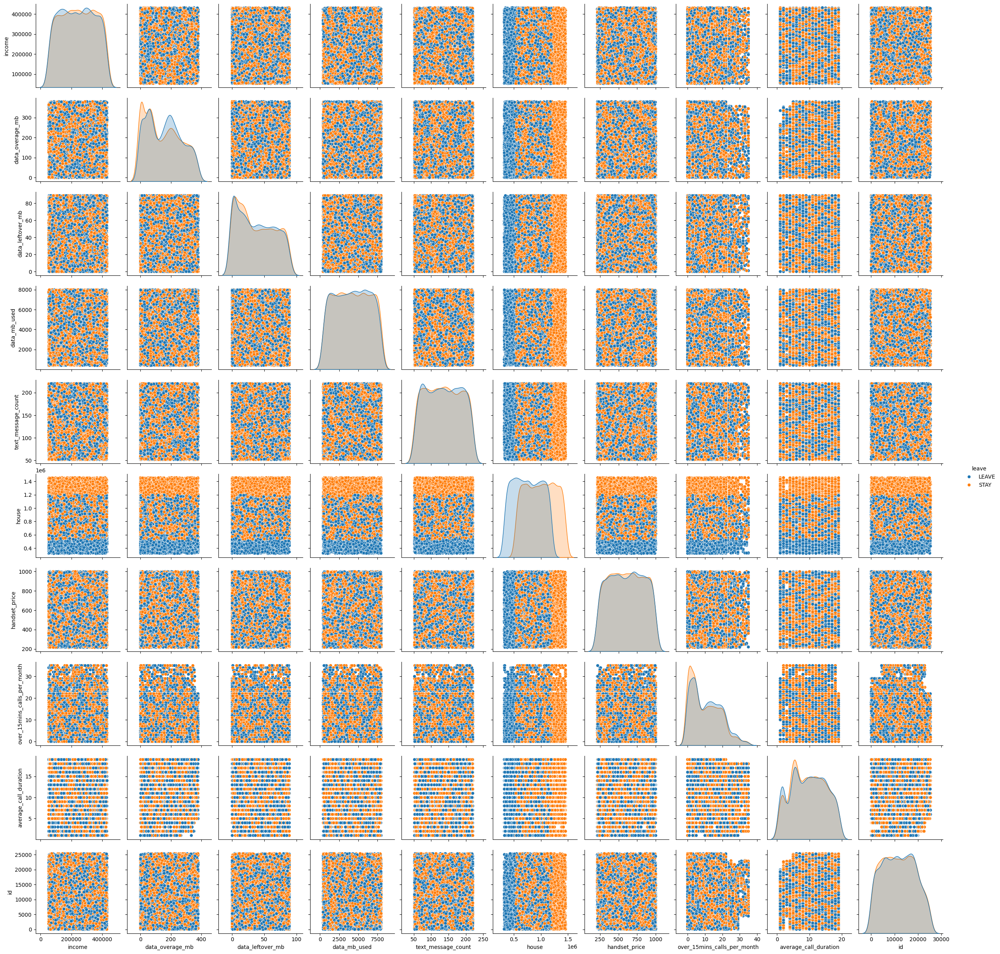

In [ ]:
import seaborn as sns
#pair plot
sns.pairplot(df_clean_noNull, hue='leave')

## Summarize Data

➡️ Assignment Tasks
- Create a second set of charts that include the outlier values (house, income, price).   How do the outliers affect the values in the charts?

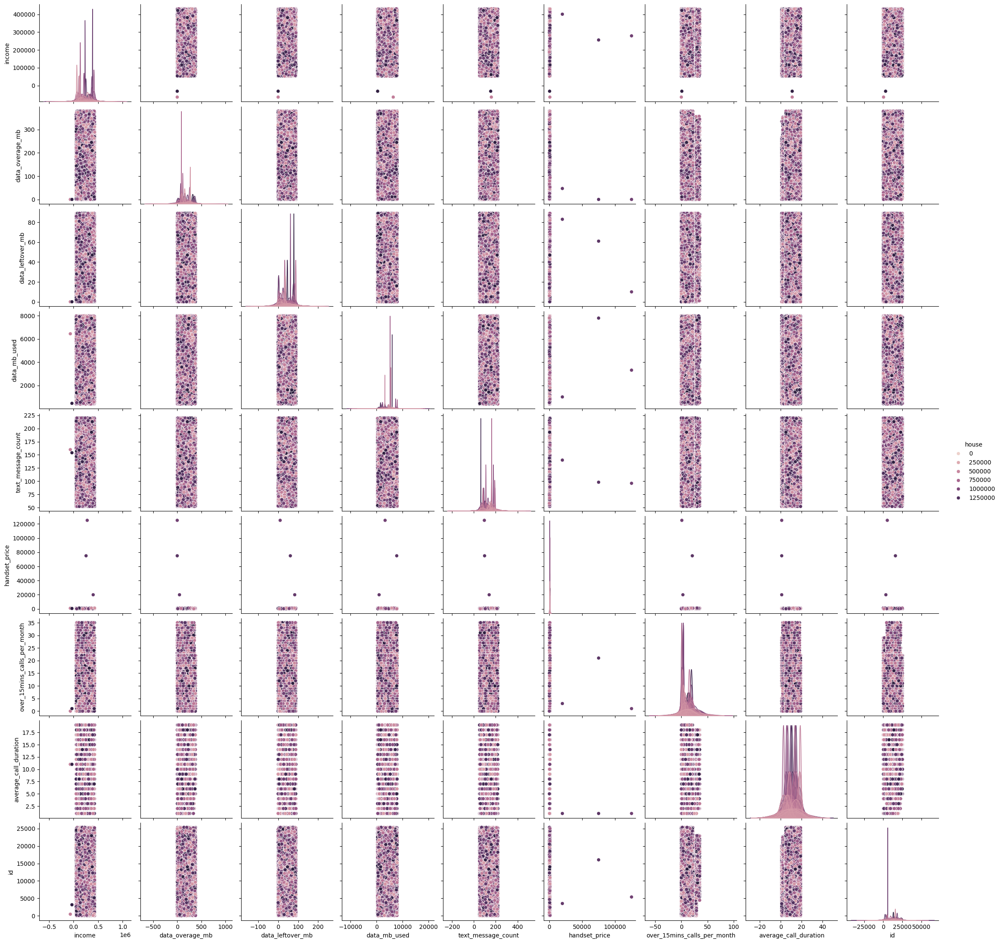

In [ ]:
import seaborn as sns
#pair plot
sns.pairplot(df, hue='house')

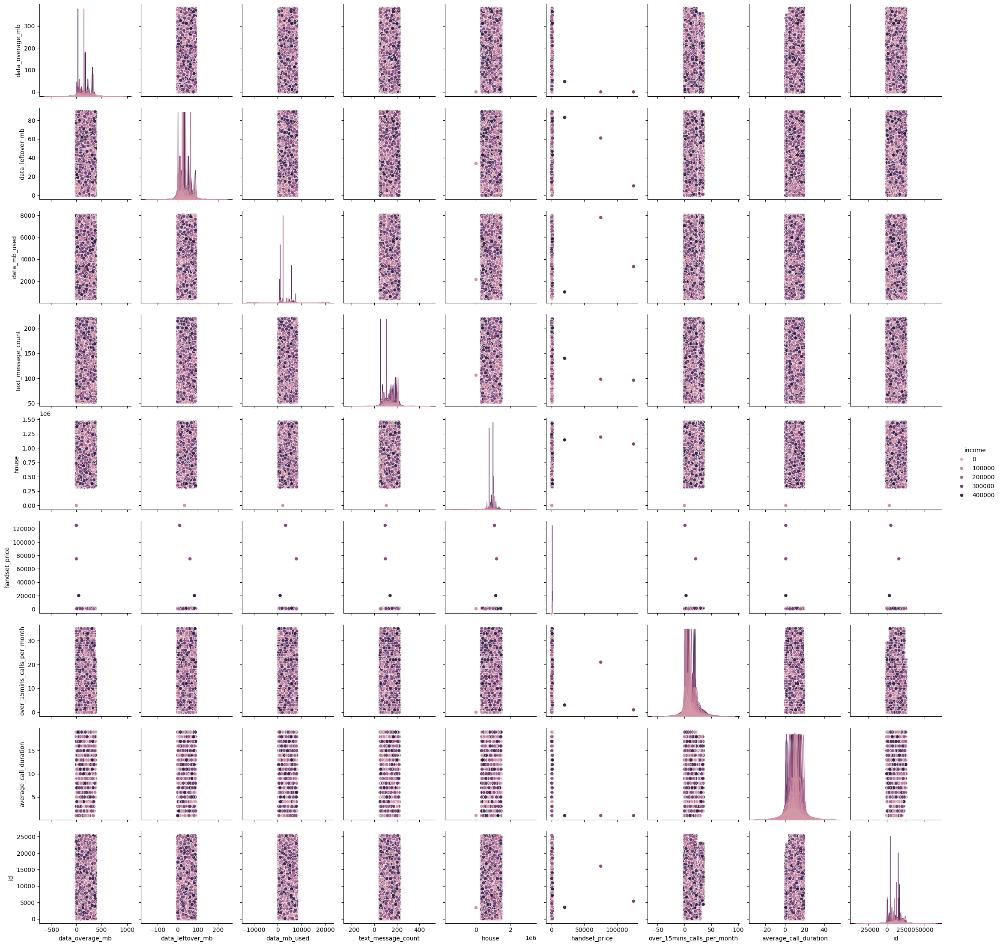

In [ ]:
import seaborn as sns
#pair plot
sns.pairplot(df, hue='income')

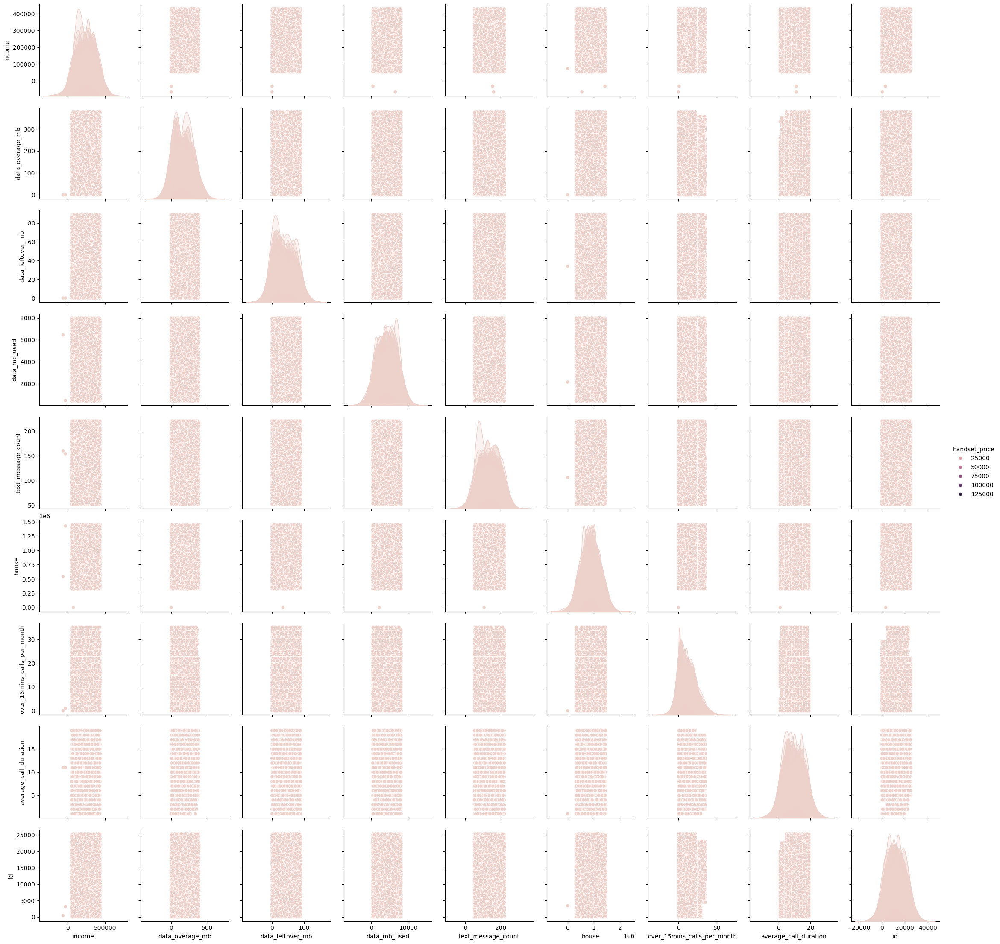

In [ ]:
import seaborn as sns
#pair plot
sns.pairplot(df, hue='handset_price')

When including the outliers in the pair plots, the scales on the plots become very stretched and exaggerated. This makes it very challenging to understand and interpret results from the plot. Eliminating the outliers is key for making sense of these plots.